Dataset: RAF-DB + FER-2013 + SFEW + AffectNet
The model architecture consists of three convolutional layers, each followed by max-pooling and dropout, ending with fully connected layers for classification.

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
# import torch
import pickle
import os
import pandas as pd
import shutil
import random
import cv2
from datetime import datetime
from mtcnn import MTCNN
# from facenet_pytorch import MTCNN
from keras.preprocessing.image import ImageDataGenerator
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from keras.regularizers import l2
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score
from deepface import DeepFace

# Data Preperation

In [32]:
# Sample image path
img_path = "Datasets/RAF-FER-SFEW-AN/angry/PublicTest_79434954.jpg"  # Update this path to an actual image file


analysis = DeepFace.analyze(img_path=img_path, actions=['emotion'], enforce_detection=False)
#print(analysis)  # Debug: Print the entire analysis to understand its structure
predicted_emotion = analysis[0]
pre = predicted_emotion['dominant_emotion']
print("Predicted emotion:", pre)

Predicted emotion: angry


In [ ]:
backends = [
  'opencv', 
  'ssd', 
  'dlib', 
  'mtcnn', 
  'retinaface', 
  'mediapipe',
  'yolov8',
  'yunet',
  'fastmtcnn',
]

img = cv2.cvtColor(cv2.imread("Datasets/combined_dataset/angry/Training_82090617.jpg"), cv2.COLOR_BGR2RGB)
detector = MTCNN()
if detector.detect_faces(img):
    print("face detected")
else:
    print(detector.detect_faces(img))

In [14]:
# Base directory where the emotion folders are located
base_dir = "../Datasets/RAF-FER-SFEW-AN"
# New dataset directory
new_dataset_dir = "Datasets/combined_dataset_correctly_identified"
test_dir = "Datasets/combined_dataset_faces_only_mtcnn"

# Emotion classes
emotions = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

# Create directories for the new dataset
# if not os.path.exists(new_dataset_dir):
#     os.makedirs(new_dataset_dir)
# for emotion in emotions:
#     os.makedirs(os.path.join(new_dataset_dir, emotion), exist_ok=True)
    
# Store results
results = {emotion: {'correct': 0, 'total': 0} for emotion in emotions}

# Randomly select and analyze 50 images per emotion
for emotion in emotions:
    emotion_dir = os.path.join(base_dir, emotion)
    all_images = os.listdir(emotion_dir)
    # selected_images = random.sample(all_images, 50)  # Assuming there are at least 50 images per folder
    for image in all_images:
        img_path = os.path.join(emotion_dir, image)
        try:
            # Analyze the image for emotion
            analysis = DeepFace.analyze(img_path=img_path, actions=['emotion'], enforce_detection=False)
            predicted_emotion = analysis[0]
            predicted = predicted_emotion['dominant_emotion']
            
            # Increment correct count if prediction matches the folder name
            if predicted == emotion:
                results[emotion]['correct'] += 1
                # Copy the correctly identified image to the new dataset
                # shutil.copy(img_path, os.path.join(new_dataset_dir, emotion, image))
            results[emotion]['total'] += 1
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

# Calculate accuracy for each class and store in a DataFrame
accuracy_data = {
    'Emotion': [],
    'Accuracy': []
}

for emotion, result in results.items():
    accuracy = (result['correct'] / result['total']) * 100 if result['total'] > 0 else 0
    accuracy_data['Emotion'].append(emotion)
    accuracy_data['Accuracy'].append(accuracy)

df_accuracy = pd.DataFrame(accuracy_data)
# Display the accuracy table
print(df_accuracy)

    Emotion   Accuracy
0     angry  47.104719
1   disgust  12.512238
2      fear  57.192564
3     happy  78.091519
4   neutral  62.249304
5       sad  54.266746
6  surprise  48.475786


# Face Detection

In [12]:
# Base directory where the emotion folders are located
base_dir = "Datasets/RAF-FER-SFEW-AN"
# New dataset directory
new_dataset_dir = "Datasets/combined_dataset_faces_only_mtcnn"

# Emotion classes
emotions = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

# Create directories for the new dataset
if not os.path.exists(new_dataset_dir):
    os.makedirs(new_dataset_dir)
for emotion in emotions:
    os.makedirs(os.path.join(new_dataset_dir, emotion), exist_ok=True)
    
for emotion in emotions:
    emotion_dir = os.path.join(base_dir, emotion)
    all_images = os.listdir(emotion_dir)
    existing_dir = os.path.join(new_dataset_dir, emotion)
    existing_images = os.listdir(existing_dir)
    all_images = [img for img in all_images if img not in existing_images]
    
    for image in all_images:
        img_path = os.path.join(emotion_dir, image)
        try:
            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            detector = MTCNN()
            
            # Increment correct count if prediction matches the folder name
            if detector.detect_faces(img):
                # Copy the correctly identified image to the new dataset
                shutil.copy(img_path, os.path.join(new_dataset_dir, emotion, image))
            
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

1/1 [==============================] - 0s 18ms/step


KeyboardInterrupt: 

# Image Cropping, Alignment and Grayscaling

In [28]:
from mtcnn import MTCNN
import cv2
import numpy as np
import os

base_dir = "Datasets/combined_dataset_faces_only_mtcnn"
new_dataset_dir = "Datasets/combined_dataset_faces_only_cropped_aligned_gray"

# Emotion classes
emotions = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

# Create directories for the new dataset
if not os.path.exists(new_dataset_dir):
    os.makedirs(new_dataset_dir)
for emotion in emotions:
    os.makedirs(os.path.join(new_dataset_dir, emotion), exist_ok=True)
    
for emotion in emotions:
    emotion_dir = os.path.join(base_dir, emotion)
    all_images = os.listdir(emotion_dir)
    existing_dir = os.path.join(new_dataset_dir, emotion)
    existing_images = os.listdir(existing_dir)
    all_images = [img for img in all_images if img not in existing_images]

    for image in all_images:
        try:
            img_path = os.path.join(emotion_dir, image) 
            # Load an image
            img = cv2.imread(img_path)
            image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
            # Detect faces in the image
            results = detector.detect_faces(image_rgb)
        
            if results:
                # Extract the bounding box and facial landmarks for the first face
                x, y, width, height = results[0]['box']
                landmarks = results[0]['keypoints']
        
                # Crop the face
                face = image_rgb[y:y + height, x:x + width]
        
                # Calculate the angle to align eyes horizontally
                left_eye = landmarks['left_eye']
                right_eye = landmarks['right_eye']
                delta_x = right_eye[0] - left_eye[0]
                delta_y = right_eye[1] - left_eye[1]
                angle = np.arctan(delta_y / delta_x) * 180 / np.pi
        
                # Center coordinates of the face
                center = (x + width // 2, y + height // 2)
        
                # Rotation matrix
                rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1)
        
                # Perform the rotation on the entire image
                aligned_image = cv2.warpAffine(img, rotation_matrix, (img.shape[1], img.shape[0]))
        
                # Crop the aligned face
                aligned_face = aligned_image[y:y + height, x:x + width]
        
                # Convert to grayscale (this is the new step)
                aligned_face_gray = cv2.cvtColor(aligned_face, cv2.COLOR_BGR2GRAY)
        
                # Save the grayscale aligned face image
                aligned_face_filename = os.path.basename(img_path).split('.')[0]
                cv2.imwrite(os.path.join(new_dataset_dir, emotion, image), aligned_face_gray)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

1/1 [==============================] - 0s 15ms/step


KeyboardInterrupt: 

# Image resizing and padding

In [32]:
from PIL import Image
import os

temp_folder = "Datasets/temp"
image_dir = 'Datasets/combined_dataset_faces_only_cropped_aligned_gray/angry'
processed_folder = 'Datasets/combined_dataset_processed'

all_images = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

target_width, target_height = 128, 128

for image_name in all_images:
    try:
        image = Image.open(image_name)
        
        # Calculate the scaling factor to maintain aspect ratio
        aspect_ratio = min(target_width / image.width, target_height / image.height)
        new_width = int(image.width * aspect_ratio)
        new_height = int(image.height * aspect_ratio)
        
        # Resize the image with the scaling factor
        image = image.resize((new_width, new_height), Image.LANCZOS)
        
        # Create a new image with a black background
        new_image = Image.new("L", (target_width, target_height), (0, 0, 0))
        # Calculate top-left corner coordinates to paste the resized image in the center
        paste_position = ((target_width - new_width) // 2, (target_height - new_height) // 2)
        
        # Paste the resized image onto the black background
        new_image.paste(image, paste_position)
        
        # Save or process the resized and padded image
        new_image.save(os.path.join(temp_folder, os.path.basename(image_name)))
    except Exception as e:
        print(f"Error processing {image_name}: {e}")

Error processing Datasets/combined_dataset_faces_only_cropped_aligned_gray/angry/.DS_Store: cannot identify image file 'Datasets/combined_dataset_faces_only_cropped_aligned_gray/angry/.DS_Store'


# Determine Landmarks, mark them and save images to new folder

In [43]:
import cv2
import os
from mtcnn import MTCNN

# Initialize the face detector
detector = MTCNN()

temp_folder = "Datasets/temp"
landmarks_folder = os.path.join(temp_folder, "landmarks")

# Create the landmarks folder if it doesn't exist
if not os.path.exists(landmarks_folder):
    os.makedirs(landmarks_folder)

all_images = [os.path.join(temp_folder, f) for f in os.listdir(temp_folder) if os.path.isfile(os.path.join(temp_folder, f))]

for image_path in all_images:
    # Load an image
    img = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Detect faces in the image
    results = detector.detect_faces(image_rgb)

    if results:
        # Extract the bounding box and facial landmarks for the first face
        x, y, width, height = results[0]['box']
        landmarks = results[0]['keypoints']

        # Mark facial landmarks on the image
        for key, point in landmarks.items():
            cv2.circle(img, (point[0], point[1]), 5, (0, 255, 0), -1)

        # Convert back to RGB since OpenCV uses BGR by default
        processed_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Define the path for the new image
        base_filename = os.path.basename(image_path)
        save_path = os.path.join(landmarks_folder, base_filename)

        # Save the image with landmarks
        cv2.imwrite(save_path, processed_image)
    else:
        print(f"No faces found in {image_path}.")


1/1 [==============================] - 0s 17ms/step
No faces found in Datasets/temp/_home_ryanjones_Desktop_facial expression_code_fer_data_archive_train_class_class007_image0020495.jpg.
1/1 [==============================] - 0s 17ms/step


error: OpenCV(4.9.0) /Users/runner/work/opencv-python/opencv-python/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
# Define paths to your training and testing directories
data_dir = 'Datasets/combined_dataset'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
mtcnn = MTCNN(keep_all=True, device=device)

# Function to add images from a directory to a list
def process_directory(directory, data_list):
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)
        # Detect faces in the image
        boxes, _ = mtcnn.detect(image)
        
        # If a face is detected, crop the face and save or append to the data list
        if boxes is not None:
            # Assuming the first detected face is the one we want
            box = boxes[0]
            face = image.crop((box[0], box[1], box[2], box[3]))
            
            # Convert the PIL Image to a NumPy array
            #face_array = np.array(face)

            # Append the face array and label to the data list
            #data_list.append({'image': face_array, 'label': class_name})

            
            # Optionally, save or directly use the face image
            # For simplicity, we'll just update the 'filepath' to point to the face image
            # You might want to actually save the cropped faces to disk and point to those
            cropped_image_path = "cropped_faces/" + image_name
            face.save(cropped_image_path)

            data_list.append({'filepath': cropped_image_path, 'label': class_name})
        # # Check if it's a directory
        # if os.path.isdir(class_dir):
        #     # Loop through each image in the folder
        #     for image_name in os.listdir(class_dir):
        #         image_path = os.path.join(class_dir, image_name)
        #         # Append to the data list
        #         data_list.append({'filepath': image_path, 'label': class_name})

# Initialize an empty list for storing data
data_list = []
# Add training images to the data list
process_directory(data_dir, data_list, mtcnn)
# Create a DataFrame from the list
df = pd.DataFrame(data_list)
# Shuffle the DataFrame
df = df.sample(frac=1).reset_index(drop=True)
# Print the amount of images per category before balancing
print("Images per category before balancing:")
print(df['label'].value_counts())
# Determine the label with the least amount of images
min_label_count = df['label'].value_counts().min()
# Reduce all categories to this size by randomly removing entries
balanced_df = df.groupby('label').sample(n=min_label_count, random_state=42).reset_index(drop=True)
# Optionally, shuffle the DataFrame again to ensure mixed labels
balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)
# Print 15 random samples of the balanced DataFrame
# print(balanced_df.sample(15))
# Print the amount of images per category after balancing
print("\nImages per category after balancing:")
print(balanced_df['label'].value_counts())

# Date preperation w/o transfer learning

In [61]:
# Define paths to your training and testing directories
data_dir = 'Datasets/FER2013/train'

# Function to add images from a directory to a list
def process_directory(directory, data_list):
    for class_name in os.listdir(directory):
        class_dir = os.path.join(directory, class_name)

        # Check if it's a directory
        if os.path.isdir(class_dir):
            # Loop through each image in the folder
            for image_name in os.listdir(class_dir):
                image_path = os.path.join(class_dir, image_name)
                # Append to the data list
                data_list.append({'filepath': image_path, 'label': class_name})

# Initialize an empty list for storing data
data_list = []
# Add training images to the data list
process_directory(data_dir, data_list)
# Create a DataFrame from the list
df = pd.DataFrame(data_list)
# Shuffle the DataFrame
df = df.sample(frac=1).reset_index(drop=True)
# Print the amount of images per category before balancing
print("Images per category before balancing:")
print(df['label'].value_counts())
# Determine the label with the least amount of images
# min_label_count = df['label'].value_counts().min()
# Reduce all categories to this size by randomly removing entries
# balanced_df = df.groupby('label').sample(n=min_label_count, random_state=42).reset_index(drop=True)
# Optionally, shuffle the DataFrame again to ensure mixed labels
# balanced_df = balanced_df.sample(frac=1).reset_index(drop=True)
# Print 15 random samples of the balanced DataFrame
# print(balanced_df.sample(15))
# Print the amount of images per category after balancing
# print("\nImages per category after balancing:")
# print(balanced_df['label'].value_counts())

Images per category before balancing:
label
happy       7215
neutral     4965
sad         4830
fear        4097
angry       3995
surprise    3171
disgust      436
Name: count, dtype: int64


# Preprocessing

In [62]:
# Set the image size and batch size
image_size = (96, 96) # Can be increased to improve accuracy or decreased to improve speed. (48, 48) for FER2013, (224, 224) for RAF-DB
batch_size = 64

# Split the data into training, validation, and test sets
train_df, test_df = train_test_split(df, test_size=0.1, random_state=42)  # 80% training, 20% test
train_df, val_df = train_test_split(train_df, test_size=0.11, random_state=42)  # Of the 80% training, split into 60% training and 20% validation

# Calculate and print split ratios
total_samples = len(df)
train_ratio = len(train_df) / total_samples
val_ratio = len(val_df) / total_samples
test_ratio = len(test_df) / total_samples

print(f"Total samples: {total_samples}")
print(f"Training set: {train_ratio:.2f} ({len(train_df)} samples)")
print(f"Validation set: {val_ratio:.2f} ({len(val_df)} samples)")
print(f"Test set: {test_ratio:.2f} ({len(test_df)} samples)\n")

# Create an ImageDataGenerator for data augmentation (optional)
train_datagen = ImageDataGenerator(
    rescale=1./255, # Normalize pixel values to [0, 1]
    rotation_range=15,  # rotation
    width_shift_range=0.05, # horizontal shift (only 5% since faces are centered)
    height_shift_range=0.05, # vertical shift (only 5% since faces are centered)
    shear_range=0.1, 
    # zoom_range=0.1,   zoom (with current dataset not needed, since faces are centered)
    horizontal_flip=True, # flip images horizontally
    fill_mode='constant', # fill in missing pixels (nearest / constant)
    # brightness_range=[0.8, 1.2] # darken and lighten images
)

val_datagen = ImageDataGenerator(rescale=1./255)  # No augmentation for validation data
test_datagen = ImageDataGenerator(rescale=1./255)  # No augmentation for test data

# Create generators
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepath',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='filepath',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='filepath',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    color_mode='grayscale',
    class_mode='categorical',
    shuffle=False
)

# Compute class weights
# Assuming 'labels' contains your class labels for the training data
labels = train_df['label'].values
unique_classes = np.unique(labels)
# Compute class weights for balanced training
class_weights = compute_class_weight('balanced', classes=unique_classes, y=labels)
# Get class indices from the generator
class_indices = train_generator.class_indices
# Ensure the order of `unique_classes` matches the order in `class_indices`
ordered_unique_classes = sorted(unique_classes, key=lambda x: class_indices[x])
# Create a dictionary mapping class indices to their weights
class_weights_dict = {class_indices[label]: weight for label, weight in zip(ordered_unique_classes, class_weights)}
print(class_weights_dict)

Total samples: 28709
Training set: 0.80 (22995 samples)
Validation set: 0.10 (2843 samples)
Test set: 0.10 (2871 samples)

Found 22995 validated image filenames belonging to 7 classes.
Found 2843 validated image filenames belonging to 7 classes.
Found 2871 validated image filenames belonging to 7 classes.
{0: 1.0349716446124764, 1: 9.439655172413794, 2: 0.9939485627836612, 3: 0.5693240901213171, 4: 0.8181818181818182, 5: 0.8510362694300518, 6: 1.3020214030915576}


# Image before and after preprocessing comparison

In [47]:
# Create a non-preprocessing ImageDataGenerator
no_preprocessing_datagen = ImageDataGenerator()

# Create a temporary generator to fetch a batch of original images
temp_generator = no_preprocessing_datagen.flow_from_directory(
    data_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Keep the same order as the original generator
)

# Function to plot images in a grid
def plot_images(images_arr):
    fig, axes = plt.subplots(5, 5, figsize=(12, 12))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img.astype('uint8'))  # Cast to uint8 for correct image display
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Fetch a batch of original images
original_batch = next(temp_generator)
original_images = original_batch[0][:25]  # Select first 25 images

# Function to plot images in a grid
def plot_images(images_arr):
    fig, axes = plt.subplots(5, 5, figsize=(12, 12))
    axes = axes.flatten()
    for img, ax in zip(images_arr, axes):
        ax.imshow(img, cmap='gray')  # Set the colormap to 'gray'
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Get a batch of images
example_batch = next(train_generator)
example_images = example_batch[0][:25]  # Select first 25 images

# Plot the images
# plot_images(original_images)
# plot_images(example_images)

Found 28709 images belonging to 7 classes.


# Model Definition
Previous model architecture neurons per layer: 
1. Start with images size (e.g. 224 for RAF-DB, 48 for FER2013) and divide by 2 for each convolutional layer
2. Pyramidal model: double the number of filters for each convolutional layer, then halve the number of filters for each convolutional layer (e.g. 64, 128, 256, 128, 64)

batch_size = 64, learning_rate = 0.0002, l2_reg = 0.002 and dropout = [0.1,0.3] give accuracy of about 50% 062527, 084021 
batch_size = 64, learning_rate = 0.0002, l2_reg = 0.004 and dropout = [0.3,0.5] doesn't work, on about epoch 4-6 jumps in accuracy in loss and accuracy. Correction: better results are achieved. Overfitting was reduced. 090307, 101603
batch_size = 256, learning_rate = 0.001, l2_reg = 0.004 and dropout = [0.3,0.5] very bad results. Probably learning rate

In [63]:
l2_reg = 0.001  # Regularization strength
dropout = [0.15, 0,4]
n_filter = [128, 64, 32, 128]

model = Sequential([
    # First Conv Block
    Conv2D(n_filter[0], (2, 2), padding='same', activation='relu', input_shape=(96, 96, 1), kernel_regularizer=l2(l2_reg)), 
    BatchNormalization(), # Batch normalization normalizes the output of a previous activation layer by subtracting the batch mean and dividing by the batch standard deviation
    MaxPooling2D(pool_size=(2, 2)), # Max pooling reduces computation by reducing the dimensionality of the feature maps
    Dropout(dropout[0]), # Dropout to prevent overfitting
    # Second Conv Block
    Conv2D(n_filter[1], (2, 2), padding='same', activation='relu', kernel_regularizer=l2(l2_reg)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(dropout[0]),
    # Third Conv Block
    Conv2D(n_filter[2], (2, 2), padding='same', activation='relu', kernel_regularizer=l2(l2_reg)),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(dropout[0]),
    # Flatten and Dense Layers
    Flatten(),
    Dense(n_filter[3], activation='relu', kernel_regularizer=l2(l2_reg)),
    BatchNormalization(),
    Dropout(dropout[1]),
    Dense(7, activation='softmax', kernel_regularizer=l2(l2_reg))  # 7 emotions
])

model.compile(optimizer=Adam(learning_rate=0.00015), loss='categorical_crossentropy', metrics=['accuracy'])

# model.summary()

# Alternative Model
ResNet50V2 expects 224x224 input. Change input accordingly

Add to train_datagen:     
preprocessing_function=preprocess_input,  # Use ResNet specific preprocessing

Data generator for the test set (no augmentation, just rescaling)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)


In [49]:
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D
# Load the ResNet50V2 model without the top layer
base_model = ResNet50V2(weights=None, include_top=False, input_shape=(224, 224, 3))
base_model.load_weights('PretrainedModels/ResNet50V2/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5')

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Add custom top layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
predictions = Dense(7, activation='softmax')(x)  # Assuming 7 emotions

# Create the final model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Model summary
# model.summary()

# Add your existing code for predictions, classification report, and confusion matrix here

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                            

# Callbacks

In [64]:
# Early stopping to prevent overfitting. This stops training when the model's performance on the validation set starts to degrade.
early_stopper = EarlyStopping(
    monitor='val_loss',  # Metric to be monitored
    patience=3,         # Number of epochs with no improvement after which training will be stopped. Reduced from 10
    restore_best_weights=True  # Restores model weights from the epoch with the best value of the monitored metric
)

# Create a ModelCheckpoint callback
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
checkpoint = ModelCheckpoint(
    f'logs/model_checkpoint_{timestamp}.keras',  # Path where to save the model
    monitor='val_loss',     # Metric to monitor
    save_best_only=False,    # Save only the best model. Set False to save the model at the end of every epoch so restarting from specific epoch is possible
    save_weights_only=False, # Save only the weights
    mode='min',             # Minimize the monitored metric (val_loss) min before
    verbose=1               # Verbose output
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=2,
    min_lr=0.0001,
    cooldown=3,
    verbose=1
)

# Model Training

In [65]:
# Load the last saved weights
# model.load_weights('model_checkpoint.keras')

epochs = 30 # When resuming training, set epochs to the total number of epochs you want to train, not just the additional epochs. The model.fit() method continues training for the specified number of epochs, starting from the current epoch count. Typically, 10 to 100 epochs are used. Start with e.g. 30-50.

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=epochs,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
    # class_weight=class_weights_dict,
    callbacks=[early_stopper, checkpoint]
)

# Save the training history for later analysis
with open(f'logs/training_history_{timestamp}.pkl', 'wb') as file:
    pickle.dump(history.history, file)

Epoch 1/30
359/359 [==============================] - ETA: 0s - loss: 2.3978 - accuracy: 0.2568
Epoch 1: saving model to logs/model_checkpoint_20240221_101831.keras
359/359 [==============================] - 372s 1s/step - loss: 2.3978 - accuracy: 0.2568 - val_loss: 4.0613 - val_accuracy: 0.1641
Epoch 2/30
359/359 [==============================] - ETA: 0s - loss: 2.0992 - accuracy: 0.3365
Epoch 2: saving model to logs/model_checkpoint_20240221_101831.keras
359/359 [==============================] - 367s 1s/step - loss: 2.0992 - accuracy: 0.3365 - val_loss: 3.6709 - val_accuracy: 0.2411
Epoch 3/30
359/359 [==============================] - ETA: 0s - loss: 2.0068 - accuracy: 0.3673
Epoch 3: saving model to logs/model_checkpoint_20240221_101831.keras
359/359 [==============================] - 351s 978ms/step - loss: 2.0068 - accuracy: 0.3673 - val_loss: 2.1071 - val_accuracy: 0.3565
Epoch 4/30
359/359 [==============================] - ETA: 0s - loss: 1.9350 - accuracy: 0.3923
Epoch 4: s

KeyboardInterrupt: 

# Evaluation and Visualization

56/56 [==============================] - 11s 196ms/step - loss: 3.1256 - accuracy: 0.1421
Test accuracy:  0.14209790527820587
56/56 [==============================] - 11s 200ms/step
Classification Report
              precision    recall  f1-score   support

       angry       0.00      0.00      0.00       550
     disgust       0.00      0.00      0.00       511
        fear       0.21      0.03      0.05       517
       happy       0.15      0.39      0.21       495
     neutral       0.14      0.61      0.23       494
         sad       0.00      0.00      0.00       486
    surprise       0.00      0.00      0.00       522

    accuracy                           0.14      3575
   macro avg       0.07      0.15      0.07      3575
weighted avg       0.07      0.14      0.07      3575

Weighted Precision: 0.06930541517749293
Weighted Recall: 0.1420979020979021
Weighted F1-Score: 0.06770279600225292


/Users/alexanderneben/Desktop/FER - MLDL Project/venv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


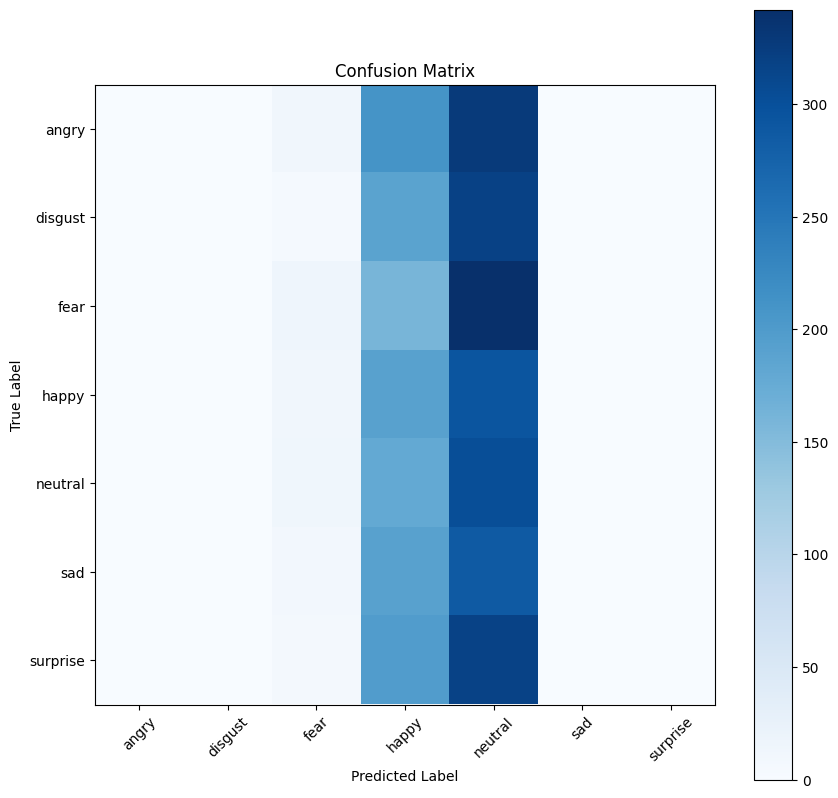

In [34]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size))
print("Test accuracy: ", test_accuracy)

# Predictions on the test set
test_generator.reset() # Ensuring the generator is reset to the beginning
predictions = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size))
predicted_classes = np.argmax(predictions, axis=1) # Convert predictions to class labels

# Since the generator omits some samples due to rounding down in 'steps', we trim 'true_classes' to match 'predicted_classes' length
true_classes = test_generator.classes
true_classes = true_classes[:len(predicted_classes)]

class_labels = list(test_generator.class_indices.keys())

# Classification report
print("Classification Report")
print(classification_report(true_classes, predicted_classes, target_names=class_labels, zero_division=0))

# Additional weighted metric calculations
weighted_precision = precision_score(true_classes, predicted_classes, average='weighted')
weighted_recall = recall_score(true_classes, predicted_classes, average='weighted')
weighted_f1 = f1_score(true_classes, predicted_classes, average='weighted')

print("Weighted Precision:", weighted_precision)
print("Weighted Recall:", weighted_recall)
print("Weighted F1-Score:", weighted_f1)

# Confusion Matrix
cm = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(10, 10))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

Conducting error analysis
This can be done by examining misclassified examples, which can provide insights into what types of errors the model is making

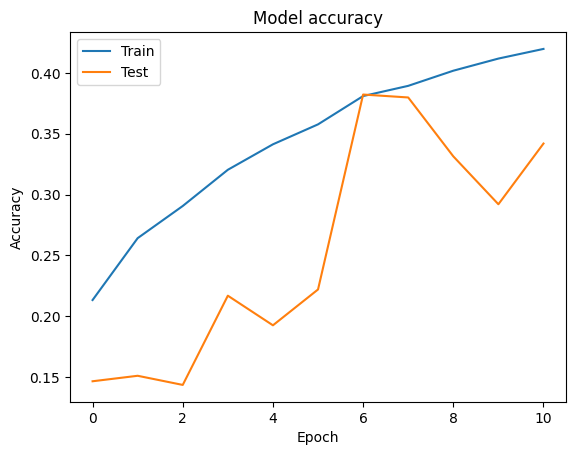

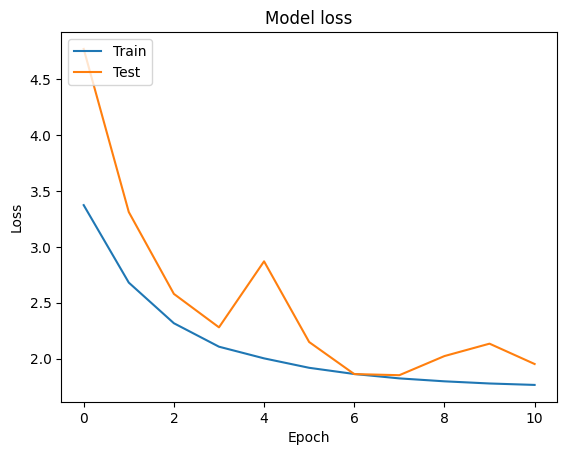

In [16]:
# Learning Curves
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

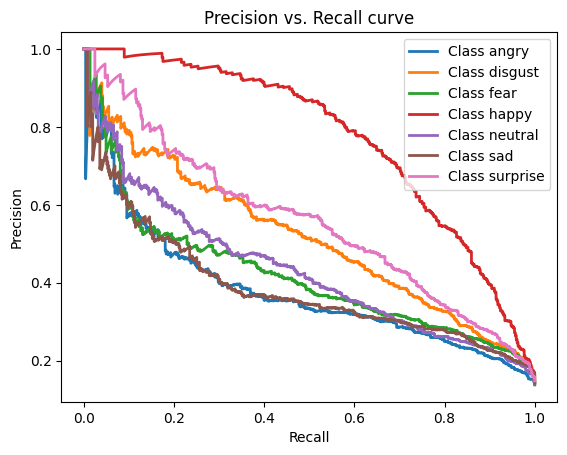

In [30]:
# Precsion-Recall Curve
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

# Binarize the labels for multi-class
y_bin = label_binarize(true_classes, classes=np.arange(len(class_labels)))
n_classes = y_bin.shape[1]

# Compute precision-recall curve for each class
precision = dict()
recall = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_bin[:, i], predictions[:, i])

# Plot the precision-recall curve
for i in range(n_classes):
    plt.plot(recall[i], precision[i], lw=2, label='Class {}'.format(class_labels[i]))

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend(loc="best")
plt.title("Precision vs. Recall curve")
plt.show()

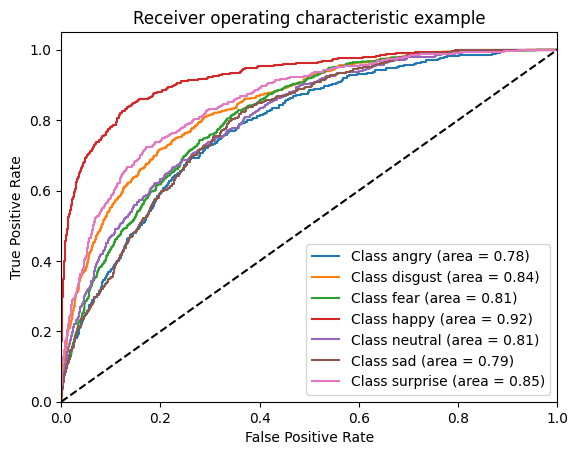

In [31]:
# ROC Curve and AUC
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='Class {} (area = {:.2f})'.format(class_labels[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()